<a href="https://colab.research.google.com/github/NielsRogge/Transformers-Tutorials/blob/master/MaskFormer/Fine-tuning/Fine_tuning_MaskFormerForInstanceSegmentation_on_semantic_sidewalk.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Fine-tune MaskFormer for semantic segmentation

In this notebook, we'll show how to fine-tune the model on a semantic segmentation dataset. In semantic segmentation, the goal for the model is to segment general semantic categories in an image, like "building", "people", "sky". No distinction is made between individual instances of a certain category, i.e. we just come up with one mask for the "people" category for instance, not for the individual persons.

Make sure to run this notebook on a GPU.

## Set-up environment

First, we install the necessary libraries. 🤗, what else? Oh yes we'll also use [Albumentations](https://albumentations.ai/), for some data augmentation to make the model more robust. You can of course use any data augmentation library of your choice.

In [1]:
!pip install -q git+https://github.com/huggingface/transformers.git

  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done


In [2]:
!pip install -q datasets

In [3]:
!pip install -q monai

In [4]:
!pip install -q albumentations

In [5]:
from PIL import Image, ExifTags
from pycocotools.coco import COCO
from matplotlib.patches import Polygon, Rectangle
from matplotlib.collections import PatchCollection
import colorsys
import random
import pylab

## Load data

Now let's the dataset from the hub.

"But how can I use my own dataset?" Glad you asked. I wrote a detailed guide for that [here](https://github.com/huggingface/transformers/tree/main/examples/pytorch/semantic-segmentation#note-on-custom-data).

In [6]:
# from datasets import load_dataset

# dataset = load_dataset("Zesky665/TACO")

In [7]:
# from datasets import load_dataset

# dataset = load_dataset("segments/sidewalk-semantic")

In [8]:
from google.colab import files

uploaded = files.upload()


Saving annotations.json to annotations.json
Saving dataset_taco.pkl to dataset_taco.pkl


In [108]:
#****SE SERVE
%cd ..
%cd content

/content
[Errno 2] No such file or directory: 'content'
/content


In [109]:
import pickle

# # Load
with open('dataset_taco.pkl', 'rb') as f:
    dataset_taco = pickle.load(f)

In [7]:
!git clone https://github.com/pedropro/TACO

fatal: destination path 'TACO' already exists and is not an empty directory.


In [110]:
#****SE SERVE
%cd ..
%cd content/TACO

/
/content/TACO


In [48]:
%cd TACO


[Errno 2] No such file or directory: 'content/TACO'
/content
ERROR: Could not open requirements file: [Errno 2] No such file or directory: 'requirements.txt'


In [50]:
!pip install -r requirements.txt

# data da Git

In [ ]:
!pip install git+https://github.com/philferriere/cocoapi.git#subdirectory=PythonAPI

Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/pip/_internal/cli/base_command.py", line 169, in exc_logging_wrapper
    status = run_func(*args)
  File "/usr/local/lib/python3.10/dist-packages/pip/_internal/cli/req_command.py", line 242, in wrapper
    return func(self, options, args)
  File "/usr/local/lib/python3.10/dist-packages/pip/_internal/commands/install.py", line 324, in run
    session = self.get_default_session(options)
  File "/usr/local/lib/python3.10/dist-packages/pip/_internal/cli/req_command.py", line 98, in get_default_session
    self._session = self.enter_context(self._build_session(options))
  File "/usr/local/lib/python3.10/dist-packages/pip/_internal/cli/req_command.py", line 125, in _build_session
    session = PipSession(
  File "/usr/local/lib/python3.10/dist-packages/pip/_internal/network/session.py", line 342, in __init__
    self.headers["User-Agent"] = user_agent()
  File "/usr/local/lib/python3.10/dist-packages/pip/_inte

In [ ]:
!python3 download.py

python3: can't open file '/content/download.py': [Errno 2] No such file or directory


#ok da qua

In [111]:
%matplotlib inline
import json
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns; sns.set()



dataset_path = './data'
anns_file_path = dataset_path + '/' + 'annotations.json'


# Read annotations
# with open(anns_file_path, 'r') as f:
#     dataset_taco = json.loads(f.read())

dataset_copy = dataset_taco.copy()

categories = dataset_taco['categories']
anns = dataset_taco['annotations']
imgs = dataset_taco['images']
nr_cats = len(categories)
nr_annotations = len(anns)
nr_images = len(imgs)

# Load categories and super categories
cat_names = []
super_cat_names = []
super_cat_ids = {}
super_cat_last_name = ''
nr_super_cats = 0
for cat_it in categories:
    cat_names.append(cat_it['name'])
    super_cat_name = cat_it['supercategory']
    # Adding new supercat
    if super_cat_name != super_cat_last_name:
        super_cat_names.append(super_cat_name)
        super_cat_ids[super_cat_name] = nr_super_cats
        super_cat_last_name = super_cat_name
        nr_super_cats += 1

print('Number of super categories:', nr_super_cats)
print('Number of categories:', nr_cats)
print('Number of annotations:', nr_annotations)
print('Number of images:', nr_images)

Number of super categories: 28
Number of categories: 60
Number of annotations: 4784
Number of images: 1500


In [112]:
len(dataset_copy['images'])

1500

NameError: name 'I' is not defined

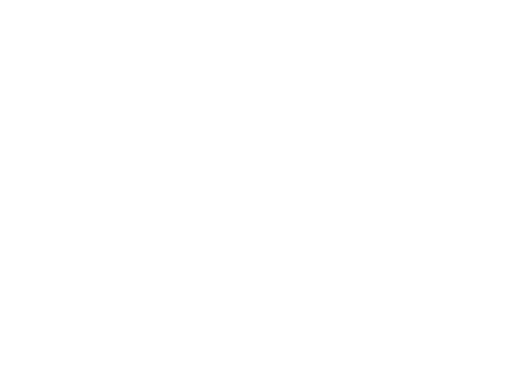

In [90]:
fig,ax = plt.subplots(1)
plt.axis('off')
plt.imshow(I)

#LABEL 0 VS 60

In [113]:
for c in dataset_taco['categories']:
  if c['id'] == 0:
    c['id'] = 60

for a in dataset_taco['annotations']:
  if a['category_id'] == 0:
    a['category_id'] = 60


dataset_taco['categories'].append({'supercategory': 'Background', 'id': 0, 'name': 'Background'})

In [114]:
for c in dataset_copy['categories']:
  if c['id'] == 0:
    c['id'] = 60

for a in dataset_copy['annotations']:
  if a['category_id'] == 0:
    a['category_id'] = 60


dataset_copy['categories'].append({'supercategory': 'Background', 'id': 0, 'name': 'Background'})

Let's take a look at this dataset in more detail. It consists of 1000 examples:

In [ ]:
# dataset

In [ ]:
# # shuffle + split dataset
# dataset = dataset.shuffle(seed=1)
# dataset = dataset["train"].train_test_split(test_size=0.2)
# train_ds = dataset["train"]
# test_ds = dataset["test"]

In [ ]:
# # let's look at one example (images are pretty high resolution)
# example = train_ds[1]
# image = example['pixel_values']
# image

#EXAMPLE

In [ ]:
id_ex = 300

example = dataset_taco['images'][id_ex]
example

{'id': 300,
 'width': 2988,
 'height': 5312,
 'file_name': 'batch_11/000099.jpg',
 'license': 'ODBL (c) OpenLitterMap & Contributors',
 'flickr_url': 'https://olm-s3.s3.eu-west-1.amazonaws.com/2019/04/01/y5A3l6LUzhWEkRac2NfxIYAlhFnA8HSzDl8nyqsZ.jpeg',
 'flickr_640_url': None,
 'coco_url': None,
 'date_captured': None,
 'label_mask': array([[0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        ...,
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0]], dtype=uint8)}

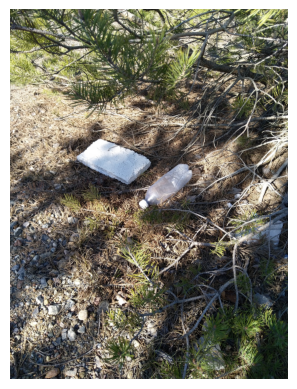

In [ ]:
id_ex = 276

example = dataset_taco['images'][id_ex]
example


import requests
from PIL import Image
import matplotlib.pyplot as plt

# Download the image
img_url = example['flickr_url']
response = requests.get(img_url, stream=True)
img = Image.open(response.raw)

# Display the image
plt.imshow(img)
plt.axis('off')  # Turn off axis labels
plt.show()


In [ ]:
label_cat = []

for ann in dataset_taco['annotations']:
  if ann['image_id'] == id_ex:
    print(ann)



    for c in dataset_taco['categories']:
      if ann['category_id'] == c['id']:
        print(c['name'])
        label_cat.append(c['id'])

print('______________________')
print(label_cat)

{'id': 851, 'image_id': 276, 'category_id': 57, 'segmentation': [[761, 1666, 824, 1709, 945, 1764, 1041, 1814, 1119, 1845, 1148, 1854, 1184, 1872, 1207, 1878, 1227, 1896, 1244, 1896, 1267, 1911, 1299, 1912, 1322, 1891, 1344, 1875, 1378, 1840, 1448, 1789, 1465, 1767, 1481, 1762, 1521, 1719, 1535, 1668, 1526, 1660, 1505, 1633, 1492, 1629, 1484, 1618, 1444, 1593, 1418, 1587, 1394, 1579, 1376, 1565, 1362, 1566, 1348, 1549, 1313, 1544, 1295, 1527, 1262, 1522, 1249, 1511, 1199, 1495, 1163, 1480, 1151, 1476, 1137, 1462, 1110, 1460, 991, 1418, 953, 1423, 922, 1444, 910, 1446, 879, 1482, 855, 1501, 838, 1515, 834, 1527, 815, 1538, 802, 1557, 774, 1566, 758, 1586, 727, 1603, 739, 1651]], 'area': 227698.5, 'bbox': [727.0, 1418.0, 808.0, 494.0], 'iscrowd': 0}
Styrofoam piece
{'id': 852, 'image_id': 276, 'category_id': 5, 'segmentation': [[1467, 2064, 1476, 2020, 1503, 1956, 1528, 1931, 1634, 1845, 1693, 1792, 1735, 1763, 1821, 1701, 1850, 1686, 1879, 1687, 1893, 1691, 1918, 1691, 1944, 1709, 1941,

In [ ]:
example['id']

93

In [ ]:
for i in dataset_taco['annotations']:
  if i['id']==308:
    print(i)
  if i['id']==309:
    print(i)
  if i['id']==310:
    print(i)
    print('_____')

  if i['image_id']==101:
    print('ehi',i)

{'id': 308, 'image_id': 89, 'category_id': 59, 'segmentation': [[704.0, 1594.0, 758.0, 1576.0, 750.0, 1560.0, 700.0, 1580.0, 704.0, 1594.0]], 'area': 894.0, 'bbox': [700.0, 1560.0, 58.0, 34.0], 'iscrowd': 0}
{'id': 309, 'image_id': 93, 'category_id': 59, 'segmentation': [[1856.0, 1064.0, 1842.0, 1070.0, 1822.0, 1038.0, 1834.0, 1026.0, 1856.0, 1064.0]], 'area': 644.0, 'bbox': [1822.0, 1026.0, 34.0, 44.0], 'iscrowd': 0}
{'id': 309, 'image_id': 101, 'category_id': 5, 'segmentation': [[1410, 1396, 1552, 1349, 1610, 1346, 1623, 1327, 1663, 1299, 1731, 1291, 1750, 1311, 1743, 1338, 1703, 1405, 1679, 1414, 1611, 1420, 1582, 1410, 1527, 1430, 1416, 1437, 1375, 1441, 1370, 1404]], 'area': 26956.999999999993, 'bbox': [1370.0, 1291.0, 380.0, 150.0], 'iscrowd': 0}
ehi {'id': 309, 'image_id': 101, 'category_id': 5, 'segmentation': [[1410, 1396, 1552, 1349, 1610, 1346, 1623, 1327, 1663, 1299, 1731, 1291, 1750, 1311, 1743, 1338, 1703, 1405, 1679, 1414, 1611, 1420, 1582, 1410, 1527, 1430, 1416, 1437, 

In [ ]:
coco = COCO(anns_file_path)

annIds = coco.getAnnIds(imgIds=example['id'], iscrowd=None)
print(annIds)
anns_sel = coco.loadAnns(annIds)
print('anns_sel:',anns_sel)
print('________')

# catIds = coco.getCatIds(imgIds=example['id'], iscrowd=None)
# cat_sel = coco.


binary_masks = []

for ann in anns_sel:
  print(ann)
  binary_masks.append(coco.annToMask(ann))

print(binary_masks)

loading annotations into memory...
Done (t=0.06s)
creating index...
index created!
[245, 309]
anns_sel: [{'id': 245, 'image_id': 93, 'category_id': 36, 'segmentation': [[593.0, 1307.0, 602.0, 1299.0, 616.0, 1295.0, 624.0, 1293.0, 687.0, 1289.0, 787.0, 1285.0, 857.0, 1278.0, 960.0, 1271.0, 1046.0, 1274.0, 1077.0, 1280.0, 1108.0, 1288.0, 1116.0, 1283.0, 1136.0, 1275.0, 1162.0, 1275.0, 1187.0, 1261.0, 1251.0, 1241.0, 1301.0, 1226.0, 1338.0, 1211.0, 1342.0, 1208.0, 1450.0, 1225.0, 1457.0, 1226.0, 1487.0, 1245.0, 1491.0, 1246.0, 1561.0, 1248.0, 1592.0, 1250.0, 1618.0, 1253.0, 1629.0, 1255.0, 1639.0, 1260.0, 1645.0, 1259.0, 1664.0, 1245.0, 1670.0, 1245.0, 1683.0, 1245.0, 1693.0, 1247.0, 1702.0, 1246.0, 1709.0, 1243.0, 1715.0, 1245.0, 1720.0, 1251.0, 1722.0, 1255.0, 1722.0, 1273.0, 1719.0, 1280.0, 1721.0, 1290.0, 1721.0, 1299.0, 1723.0, 1308.0, 1726.0, 1324.0, 1729.0, 1350.0, 1738.0, 1383.0, 1742.0, 1391.0, 1746.0, 1424.0, 1754.0, 1454.0, 1762.0, 1466.0, 1775.0, 1501.0, 1785.0, 1530.0, 1793.0

In [ ]:
label_masks = []

for i in range(len(binary_masks)):
  label_masks.append(label_cat[i] * binary_masks[i])

print(label_masks)

[array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=uint8), array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=uint8)]


In [ ]:
area = {}

for i in range(len(label_masks)):
  area[i] = np.count_nonzero(label_masks[i])

sorted_items = sorted(area.items(), key=lambda x: x[1], reverse=True)

In [ ]:
sorted_items

[(0, 841190), (1, 26967)]

In [ ]:
sorted_items[1:]

[(1, 26967)]

In [ ]:
label_mask = label_masks[sorted_items[0][0]]

for lab in label_masks:
  print(lab.shape)
for s in sorted_items[1:]:
  i = s[0]

  overlap_pixels = np.logical_and(label_mask, label_masks[i])

  label_mask1 = label_masks[i]

  label_mask += label_masks[i]

  label_mask[overlap_pixels] = label_mask1[overlap_pixels]


(3264, 2448)
(4000, 1824)


ValueError: operands could not be broadcast together with shapes (3264,2448) (4000,1824) 

In [ ]:
uni = np.unique(label_mask)
uni

array([ 0, 36], dtype=uint8)

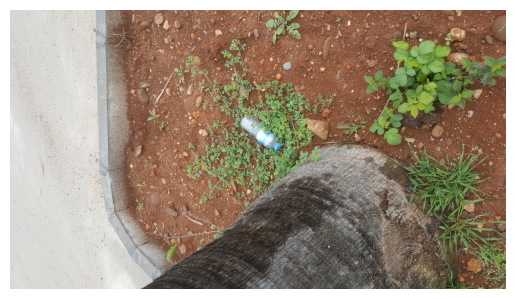

In [ ]:
id_ex = 300

example = dataset_taco['images'][id_ex]
example


import requests
from PIL import Image
import matplotlib.pyplot as plt

# Download the image
img_url = example['flickr_url']
response = requests.get(img_url, stream=True)
img = Image.open(response.raw)

# Display the image
plt.imshow(img)
plt.axis('off')  # Turn off axis labels
plt.show()

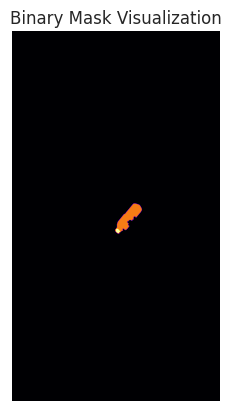

In [ ]:
import matplotlib.pyplot as plt


# Display the binary mask as an image
plt.imshow(np.array(example['label_mask']), cmap='inferno')  # Use 'gray' colormap for binary images
plt.title('Binary Mask Visualization')
plt.axis('off')

plt.show()

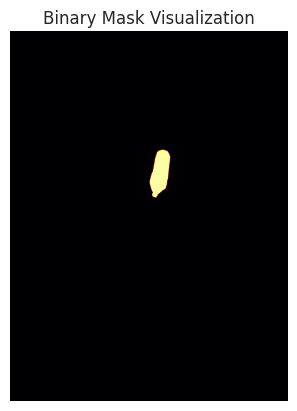

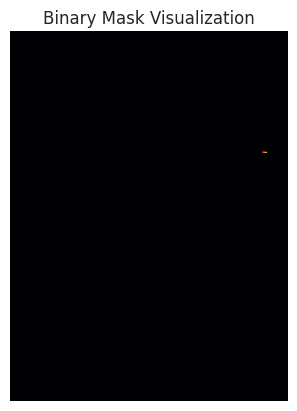

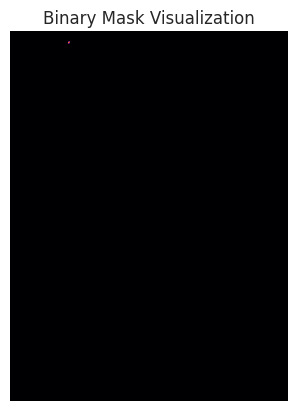

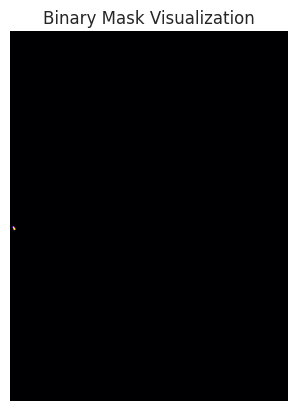

In [ ]:
import matplotlib.pyplot as plt

for i in range(len(binary_masks)):
  # Display the binary mask as an image
  plt.imshow(np.array(binary_masks[i]), cmap='inferno')  # Use 'gray' colormap for binary images
  plt.title('Binary Mask Visualization')
  plt.axis('off')

  plt.show()

In [ ]:
# # let's look at one example (images are pretty high resolution)
# example = train_ds[1]
# image = example['pixel_values']
# image

this is the segmentation map that we want:


In [ ]:
# import numpy as np

# # load corresponding ground truth segmentation map, which includes a label per pixel
# segmentation_map = np.ardray(example['label'])
# segmentation_map

array([[10, 10, 10, ..., 28, 28, 28],
       [10, 10, 10, ..., 28, 28, 28],
       [10, 10, 10, ..., 28, 28, 28],
       ...,
       [ 1,  1,  1, ..., 28, 28, 28],
       [ 1,  1,  1, ..., 28, 28, 28],
       [ 1,  1,  1, ..., 28, 28, 28]], dtype=uint8)

In [ ]:
# import numpy as np

# # load corresponding ground truth segmentation map, which includes a label per pixel
# segmentation_map = np.array(example['label'])
# segmentation_map

#DATASET...


In [110]:
erica = ['a','b','c','d','e']
for i,eleni in enumerate(erica):
  print(len(erica))
  print('__')
  print(i,eleni)
  if eleni == 'c':
    del erica[i]
    continue
  print(eleni)
  print(erica)
print(erica)

5
__
0 a
a
['a', 'b', 'c', 'd', 'e']
5
__
1 b
b
['a', 'b', 'c', 'd', 'e']
5
__
2 c
4
__
3 e
e
['a', 'b', 'd', 'e']
['a', 'b', 'd', 'e']


In [85]:
dataset_taco['images']['id'==0]

{'id': 0,
 'width': 1537,
 'height': 2049,
 'file_name': 'batch_1/000006.jpg',
 'license': None,
 'flickr_url': 'https://farm66.staticflickr.com/65535/33978196618_e30a59e0a8_o.png',
 'coco_url': None,
 'date_captured': None,
 'flickr_640_url': 'https://farm66.staticflickr.com/65535/33978196618_632623b4fc_z.jpg'}

In [130]:
dataset_taco['images'][:215]

[{'id': 6,
  'width': 1537,
  'height': 2049,
  'file_name': 'batch_1/000055.jpg',
  'license': None,
  'flickr_url': 'https://farm66.staticflickr.com/65535/47803332212_af8cfa9704_o.png',
  'coco_url': None,
  'date_captured': None,
  'flickr_640_url': 'https://farm66.staticflickr.com/65535/47803332212_0ff13e5eb1_z.jpg',
  'label_mask': array([[0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0],
         ...,
         [0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0]], dtype=uint8)},
 {'id': 7,
  'width': 2049,
  'height': 1537,
  'file_name': 'batch_1/000001.jpg',
  'license': None,
  'flickr_url': 'https://farm66.staticflickr.com/65535/33978202498_effbca58ef_o.png',
  'coco_url': None,
  'date_captured': None,
  'flickr_640_url': 'https://farm66.staticflickr.com/65535/33978202498_ef6d507616_z.jpg',
  'label_mask': array([[0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 

In [115]:
import torch

# Assicurati che la GPU sia disponibile
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

coco = COCO(anns_file_path)
indexes_to_remove = []
# for i in [93,118,162]:
#   del dataset_taco['images']['id'==i]

for ind,img in enumerate(dataset_copy['images'][:215]):

  #print('inizio:',img['id'])
  # print(id)

  if img['id'] == 93:
    indexes_to_remove.append(ind)
    #del dataset_taco['images']['id'==93]
    continue

  if img['id'] == 119:
    indexes_to_remove.append(ind-1)
    #del dataset_taco['images']['id'==118]
    continue

  if img['id'] == 162:
    indexes_to_remove.append(ind-2)
    #del dataset_taco['images']['id'==162]
    continue


  # for ann in dataset_taco['annotations']:

  #   label_cat.append(ann['category_id'])

  #   # if ann['image_id'] == img['id']:
  #   #   for c in dataset_taco['categories']:
  #   #     if ann['category_id'] == c['id']:
  #   #       label_cat.append(c['id'])

  annIds = coco.getAnnIds(imgIds=img['id'], iscrowd=None)
  anns_sel = coco.loadAnns(annIds)

  #label_cat = []
  binary_masks = []
  label_masks = []
  area = {}

  for i, ann in enumerate(anns_sel):
    #label_cat.append(ann['category_id'])
    binary_masks.append(coco.annToMask(ann))
    label_masks.append(ann['category_id'] * binary_masks[i])
    #area[i] = np.count_nonzero(label_masks[i])
    area[i] = ann['area']

    # label_cat.append(ann['category_id'])
  label_masks_gpu = [torch.tensor(label_mask, device=device) for label_mask in label_masks]


  # for i in range(len(binary_masks)):
  #   label_masks.append(label_cat[i] * binary_masks[i])

  # area = {}
  # for i in range(len(label_masks)):
  #   area[i] = np.count_nonzero(label_masks[i])

  sorted_items = sorted(area.items(), key=lambda x: x[1], reverse=True)

  # label_mask = label_masks[sorted_items[0][0]]
  label_mask = label_masks_gpu[sorted_items[0][0]]
  for s in sorted_items[1:]:
    i = s[0]

    overlap_pixels = torch.logical_and(label_mask, label_masks_gpu[i])

    label_mask1 = label_masks_gpu[i]

    label_mask += label_masks_gpu[i]

    label_mask[overlap_pixels] = label_mask1[overlap_pixels]

  img['label_mask'] = label_mask.cpu().numpy()

  #print('fine:',img['id'])

# for i in [93,118,162]:
#   del dataset_taco['images']['id'==i]

  # label_masks_cpu = [tensor.cpu().numpy() for tensor in label_masks_gpu]

loading annotations into memory...
Done (t=0.05s)
creating index...
index created!


In [116]:
indexes_to_remove

[93, 118, 160]

In [117]:
for index in indexes_to_remove:
    dataset_taco['images'].pop(index)

#TACOset

In [118]:
TACOset = dataset_taco['images'][:200]

In [119]:
len(TACOset)

200

Let's look at the semantic categories in this particular example.

In [33]:
np.unique(TACOset[68]['label_mask'])

array([ 0, 10, 25], dtype=uint8)

In [35]:
np.unique(TACOset[68]['label_mask'] == dataset_taco['images'][id]['label_mask'])

array([ True])

In [27]:
id = 137

In [42]:

dataset_taco['images'][id]

{'id': 162,
 'width': 4000,
 'height': 1824,
 'file_name': 'batch_10/000061.jpg',
 'license': 'CC',
 'flickr_url': 'https://farm66.staticflickr.com/65535/48693781338_271cce87c2_o.png',
 'flickr_640_url': 'https://farm66.staticflickr.com/65535/48693781338_fecb8cb0d1_z.jpg',
 'coco_url': None,
 'date_captured': None,
 'label_mask': array([[0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        ...,
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0]], dtype=uint8)}

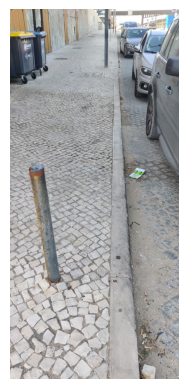

In [28]:
import requests
from PIL import Image
import matplotlib.pyplot as plt

# Download the image
img_url = dataset_taco['images'][id]['flickr_url']
response = requests.get(img_url, stream=True)
img = Image.open(response.raw)

# Display the image
plt.imshow(img)
plt.axis('off')  # Turn off axis labels
plt.show()


(4000, 1824)
[ 0 14 58 59]


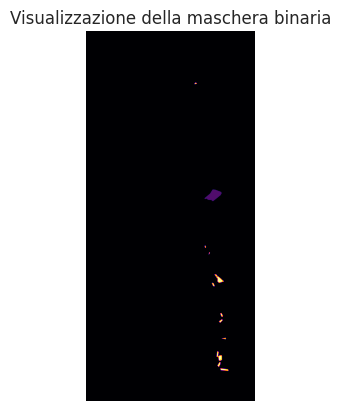

In [29]:
import matplotlib.pyplot as plt


label_mask_cpu = dataset_taco['images'][id]['label_mask']

print(label_mask_cpu.shape)
print(np.unique(label_mask_cpu))


# Display the binary mask as an image
plt.imshow(label_mask_cpu, cmap='inferno')  # Usa la mappa di colori 'inferno' per immagini binarie
plt.title('Visualizzazione della maschera binaria')
plt.axis('off')

plt.show()


Cool, but we want to know the actual class names. For that we need the id2label mapping, which is hosted in a repo on the hub.

#ID2LABEL

In [120]:
id2label = {}
for k in dataset_taco['categories']:
  id2label[k['id']] = k['name']

In [ ]:
# from huggingface_hub import hf_hub_download
# import json

# repo_id = f"segments/sidewalk-semantic"
# filename = "id2label.json"
# id2label = json.load(open(hf_hub_download(repo_id, filename, repo_type="dataset"), "r"))
# id2label = {int(k):v for k,v in id2label.items()}
# print(id2label)

In [ ]:
# labels = [id2label[label] for label in np.unique(segmentation_map)]
# print(labels)

['flat-road', 'flat-parkingdriveway', 'flat-curb', 'vehicle-car', 'construction-building', 'object-pole', 'object-trafficsign', 'nature-vegetation', 'sky', 'void-static']


#Let's visualize it:

In [136]:
def color_palette():
    """Color palette that maps each class to RGB values.

    This one is actually taken from ADE20k.
    """
    return [[120, 120, 120], [180, 120, 120], [6, 230, 230], [80, 50, 50],
            [4, 200, 3], [120, 120, 80], [140, 140, 140], [204, 5, 255],
            [230, 230, 230], [4, 250, 7], [224, 5, 255], [235, 255, 7],
            [150, 5, 61], [120, 120, 70], [8, 255, 51], [255, 6, 82],
            [143, 255, 140], [204, 255, 4], [255, 51, 7], [204, 70, 3],
            [0, 102, 200], [61, 230, 250], [255, 6, 51], [11, 102, 255],
            [255, 7, 71], [255, 9, 224], [9, 7, 230], [220, 220, 220],
            [255, 9, 92], [112, 9, 255], [8, 255, 214], [7, 255, 224],
            [255, 184, 6], [10, 255, 71], [255, 41, 10], [7, 255, 255],
            [224, 255, 8], [102, 8, 255], [255, 61, 6], [255, 194, 7],
            [255, 122, 8], [0, 255, 20], [255, 8, 41], [255, 5, 153],
            [6, 51, 255], [235, 12, 255], [160, 150, 20], [0, 163, 255],
            [140, 140, 140], [250, 10, 15], [20, 255, 0], [31, 255, 0],
            [255, 31, 0], [255, 224, 0], [153, 255, 0], [0, 0, 255],
            [255, 71, 0], [0, 235, 255], [0, 173, 255], [31, 0, 255],
            [11, 200, 200], [255, 82, 0], [0, 255, 245], [0, 61, 255],
            [0, 255, 112], [0, 255, 133], [255, 0, 0], [255, 163, 0],
            [255, 102, 0], [194, 255, 0], [0, 143, 255], [51, 255, 0],
            [0, 82, 255], [0, 255, 41], [0, 255, 173], [10, 0, 255],
            [173, 255, 0], [0, 255, 153], [255, 92, 0], [255, 0, 255],
            [255, 0, 245], [255, 0, 102], [255, 173, 0], [255, 0, 20],
            [255, 184, 184], [0, 31, 255], [0, 255, 61], [0, 71, 255],
            [255, 0, 204], [0, 255, 194], [0, 255, 82], [0, 10, 255],
            [0, 112, 255], [51, 0, 255], [0, 194, 255], [0, 122, 255],
            [0, 255, 163], [255, 153, 0], [0, 255, 10], [255, 112, 0],
            [143, 255, 0], [82, 0, 255], [163, 255, 0], [255, 235, 0],
            [8, 184, 170], [133, 0, 255], [0, 255, 92], [184, 0, 255],
            [255, 0, 31], [0, 184, 255], [0, 214, 255], [255, 0, 112],
            [92, 255, 0], [0, 224, 255], [112, 224, 255], [70, 184, 160],
            [163, 0, 255], [153, 0, 255], [71, 255, 0], [255, 0, 163],
            [255, 204, 0], [255, 0, 143], [0, 255, 235], [133, 255, 0],
            [255, 0, 235], [245, 0, 255], [255, 0, 122], [255, 245, 0],
            [10, 190, 212], [214, 255, 0], [0, 204, 255], [20, 0, 255],
            [255, 255, 0], [0, 153, 255], [0, 41, 255], [0, 255, 204],
            [41, 0, 255], [41, 255, 0], [173, 0, 255], [0, 245, 255],
            [71, 0, 255], [122, 0, 255], [0, 255, 184], [0, 92, 255],
            [184, 255, 0], [0, 133, 255], [255, 214, 0], [25, 194, 194],
            [102, 255, 0], [92, 0, 255]]

palette = color_palette()

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

image = TACOset[0]
segmentation_map = TACOset[0]['label_mask']

color_segmentation_map = np.zeros((segmentation_map.shape[0], segmentation_map.shape[1], 3), dtype=np.uint8) # height, width, 3
for label, color in enumerate(palette):
    color_segmentation_map[segmentation_map - 1 == label, :] = color
# Convert to BGR
ground_truth_color_seg = color_segmentation_map[..., ::-1]

img = np.array(image) * 0.5 + ground_truth_color_seg * 0.5
img = img.astype(np.uint8)

plt.figure(figsize=(15, 10))
plt.imshow(img)
plt.show()

TypeError: can't convert cuda:0 device type tensor to numpy. Use Tensor.cpu() to copy the tensor to host memory first.

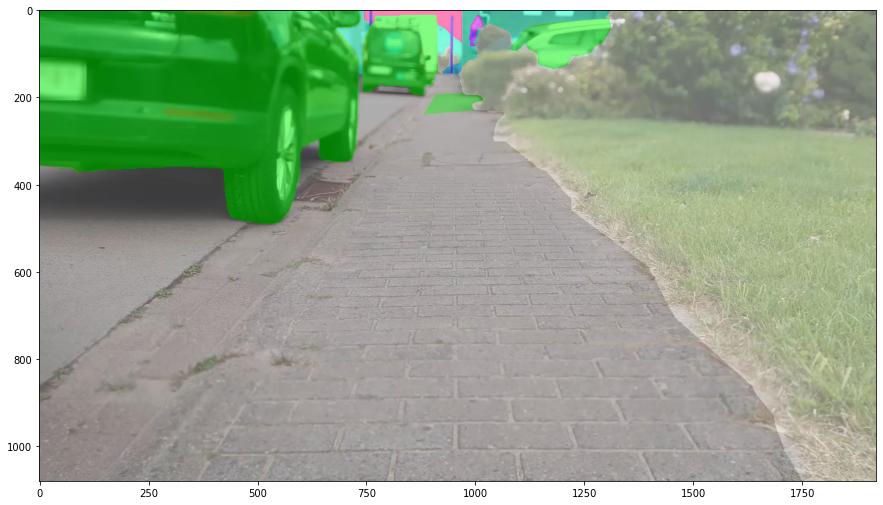

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

color_segmentation_map = np.zeros((segmentation_map.shape[0], segmentation_map.shape[1], 3), dtype=np.uint8) # height, width, 3
for label, color in enumerate(palette):
    color_segmentation_map[segmentation_map - 1 == label, :] = color
# Convert to BGR
ground_truth_color_seg = color_segmentation_map[..., ::-1]

img = np.array(image) * 0.5 + ground_truth_color_seg * 0.5
img = img.astype(np.uint8)

plt.figure(figsize=(15, 10))
plt.imshow(img)
plt.show()

## Create PyTorch Dataset

Next, we create a standard PyTorch dataset. Each item of the dataset consists of the image and corresponding ground truth segmentation map. We also include the original image + map (before preprocessing) in order to compute metrics like mIoU.

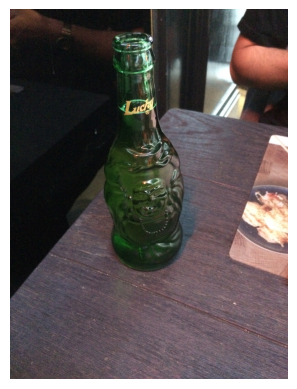

In [ ]:
import requests
from PIL import Image
import matplotlib.pyplot as plt

# Download the image
img_url = TACOset[0]['flickr_url']
response = requests.get(img_url, stream=True)
img = Image.open(response.raw)

# Display the image
plt.imshow(img)
plt.axis('off')  # Turn off axis labels
plt.show()

#TRAIN TEST SPLIT


In [121]:
from sklearn.model_selection import train_test_split
import random


# # shuffle + split dataset
TACOset_train, TACOset_test = train_test_split(TACOset, test_size=0.25, random_state = 2024)

In [80]:
len(TACOset_train)

150

In [40]:
TACOset[90]

{'id': 93,
 'width': 2448,
 'height': 3264,
 'file_name': 'batch_1/000120.JPG',
 'license': None,
 'flickr_url': 'https://farm66.staticflickr.com/65535/32911436277_8e046cc764_o.png',
 'coco_url': None,
 'date_captured': None,
 'flickr_640_url': 'https://farm66.staticflickr.com/65535/32911436277_150d3aea25_z.jpg'}

In [122]:
# Obtain Exif orientation tag code
# for orientation in ExifTags.TAGS.keys():
#     if ExifTags.TAGS[orientation] == 'Orientation':
#         break


import numpy as np
from torch.utils.data import Dataset
import requests
from PIL import Image
import matplotlib.pyplot as plt


class ImageSegmentationDataset(Dataset):
    """Image segmentation dataset."""

    def __init__(self, dataset, transform):
        """
        Args:
            dataset
        """
        self.dataset = dataset
        self.transform = transform

    def __len__(self):
        return len(self.dataset)

    def __getitem__(self, idx):

      for orientation in ExifTags.TAGS.keys():
        if ExifTags.TAGS[orientation] == 'Orientation':
            break

      flickr = self.dataset[idx]['flickr_url']
      response = requests.get(flickr, stream=True)
      I = Image.open(response.raw)

      # Load and process image metadata
      if I._getexif():
        exif = dict(I._getexif().items())
        # Rotate portrait and upside down images if necessary
        if orientation in exif:
            if exif[orientation] == 3:
                I = I.rotate(180,expand=True)
            if exif[orientation] == 6:
                I = I.rotate(270,expand=True)
            if exif[orientation] == 8:
                I = I.rotate(90,expand=True)

      original_image = np.array(I)
      original_segmentation_map = np.array(self.dataset[idx]['label_mask'])

      transformed = self.transform(image=original_image, mask=original_segmentation_map)
      image, segmentation_map = transformed['image'], transformed['mask']

      original_id = self.dataset[idx]['id']

      # convert to C, H, W
      image = image.transpose(2,0,1)

      return image, segmentation_map, original_image, original_segmentation_map, original_id

The dataset accepts image transformations which can be applied on both the image and the map. Here we use Albumentations, to resize, randomly crop + flip and normalize them. Data augmentation is a widely used technique in computer vision to make the model more robust.

In [123]:
import albumentations as A

ADE_MEAN = np.array([123.675, 116.280, 103.530]) / 255
ADE_STD = np.array([58.395, 57.120, 57.375]) / 255

train_transform = A.Compose([
    A.LongestMaxSize(max_size=1333),
    A.Resize(width=240, height=240),
    A.HorizontalFlip(p=0.5),
    A.Normalize(mean=ADE_MEAN, std=ADE_STD)],
    is_check_shapes = True
)

test_transform = A.Compose([
    A.Resize(width=240, height=240),
    A.Normalize(mean=ADE_MEAN, std=ADE_STD)],
    is_check_shapes = True

)

train_dataset = ImageSegmentationDataset(TACOset_train, transform=train_transform)
test_dataset = ImageSegmentationDataset(TACOset_test, transform=test_transform)

In [25]:
i=62
print(train_dataset[i][0].shape)
print(train_dataset[i][1].shape)
print(train_dataset[i][2].shape)
print(train_dataset[i][3].shape)
print(train_dataset[i][4])
print(np.unique(train_dataset[i][1]))

(3, 240, 240)
(240, 240)
(4000, 1824, 3)
(4000, 1824)
137
[ 0 14 58 59]


In [37]:
image, segmentation_map, _, _ = train_dataset[68]
print(image.shape)
print(segmentation_map.shape)

(3, 240, 240)
(240, 240)


In [ ]:
for i in range(375):
  try:
    image, segmentation_map, _, _ = train_dataset[i]
    #print(image.shape)
    #print(segmentation_map.shape)
  except:
    print('il problema è l indice', i)

In [ ]:
train_dataset[68]

A great way to check that our data augmentations are working well is by denormalizing the pixel values. So here we perform the inverse operation of Albumentations' normalize method and visualize the image:

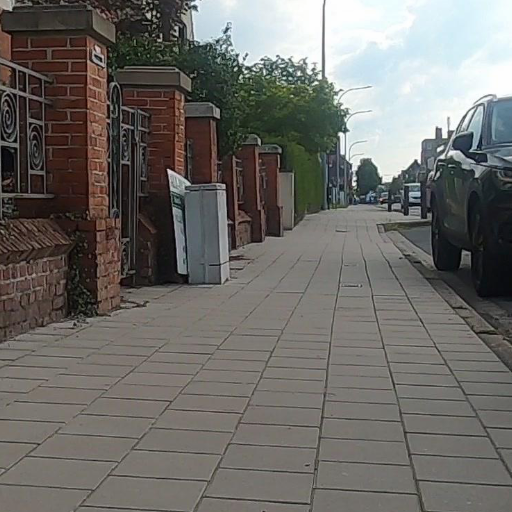

In [ ]:
from PIL import Image

unnormalized_image = (image * np.array(ADE_STD)[:, None, None]) + np.array(ADE_MEAN)[:, None, None]
unnormalized_image = (unnormalized_image * 255).astype(np.uint8)
unnormalized_image = np.moveaxis(unnormalized_image, 0, -1)
Image.fromarray(unnormalized_image)

This looks ok. Let's also verify whether the corresponding ground truth map is still ok.

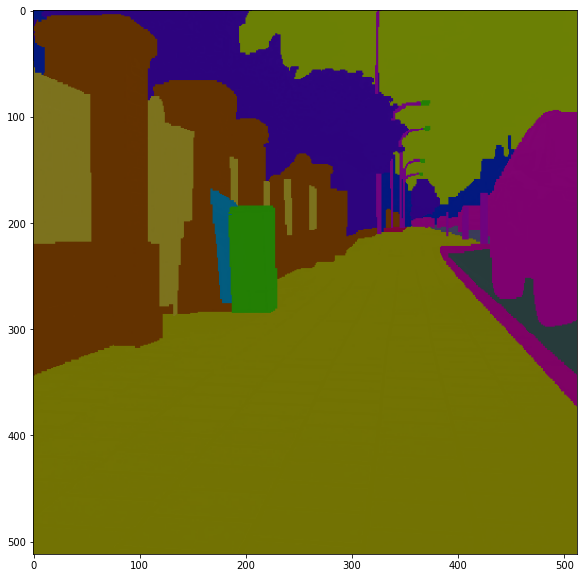

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

color_segmentation_map = np.zeros((segmentation_map.shape[0], segmentation_map.shape[1], 3), dtype=np.uint8) # height, width, 3
for label, color in enumerate(palette):
    color_segmentation_map[segmentation_map == label, :] = color
# Convert to BGR
ground_truth_color_seg = color_segmentation_map[..., ::-1]

img = np.moveaxis(image, 0, -1) * 0.5 + ground_truth_color_seg * 0.5
img = img.astype(np.uint8)

plt.figure(figsize=(15, 10))
plt.imshow(img)
plt.show()

Ok great!

## Create PyTorch DataLoaders

Next we create PyTorch DataLoaders, which allow us to get batches of the dataset. For that we define a custom so-called "collate function", which PyTorch allows you to do. It's in this function that we'll use the preprocessor of MaskFormer, to turn the images + maps into the format that MaskFormer expects.

It's here that we make the paradigm shift that the MaskFormer authors introduced: the "per-pixel" annotations of the segmentation map will be turned into a set of binary masks and corresponding labels. It's this format on which we can train MaskFormer. MaskFormer namely casts any image segmentation task to this format.

#preprocessor

In [124]:
from transformers import MaskFormerImageProcessor

# Create a preprocessor
preprocessor = MaskFormerImageProcessor(ignore_index=0,do_reduce_labels=False, do_resize=False, do_rescale=False, do_normalize=False)

In [125]:
for i,elem in enumerate(train_dataset):
  imageP, segmentation_mapP, _, _, ind = train_dataset[i]
  #print('-----')
  #print(np.unique(segmentation_mapP))

  try:

    B = preprocessor(
        imageP,
        segmentation_maps=segmentation_mapP,
        return_tensors="pt",
    )
  except:
    print(np.unique(segmentation_mapP))
    print('indice malefico',ind)

In [85]:
print(i)
print('actual index',train_dataset[i][4])
print(elem)


37
actual index 6
(array([[[ 0.69055563,  0.65630615,  0.67343086, ...,  0.82755363,
          0.87892795,  0.8446784 ],
        [ 0.7076804 ,  0.7076804 ,  0.69055563, ...,  0.7419299 ,
          0.7419299 ,  0.87892795],
        [ 0.69055563,  0.69055563,  0.69055563, ...,  0.7419299 ,
          0.82755363,  0.8446784 ],
        ...,
        [-0.30268008, -0.2170563 , -0.23418106, ..., -0.02868401,
         -0.2170563 , -0.26843056],
        [-0.26843056, -0.2855553 , -0.25130582, ..., -0.23418106,
         -0.16568205, -0.2855553 ],
        [-0.14855729, -0.16568205, -0.19993155, ..., -0.06293352,
         -0.14855729, -0.13143253]],

       [[ 0.52030814,  0.4852941 ,  0.5028011 , ...,  0.76540613,
          0.83543414,  0.80042017],
        [ 0.4852941 ,  0.5553221 ,  0.5728291 , ...,  0.6953781 ,
          0.6778711 ,  0.8179271 ],
        [ 0.4852941 ,  0.5378151 ,  0.5378151 , ...,  0.66036415,
          0.7478991 ,  0.78291315],
        ...,
        [-0.44257697, -0.39005598, 

In [ ]:
print(B)

{'pixel_values': tensor([[[[ 0.8961,  0.9474,  1.0844,  ..., -0.3712,  0.5193,  1.1015],
          [ 0.8276,  0.9303,  0.9474,  ...,  0.6734,  1.1015,  0.7591],
          [ 0.9474,  1.2385,  1.1187,  ...,  1.2214,  1.5982,  1.6153],
          ...,
          [ 0.6563,  0.6049,  0.6221,  ...,  1.6495,  1.7180,  1.7352],
          [ 1.3927,  1.5468,  0.5022,  ...,  1.7180,  1.7180,  1.7694],
          [ 0.4508,  0.7419,  0.7762,  ...,  1.5982,  1.6838,  1.7865]],

         [[ 0.9405,  0.9755,  1.0980,  ..., -0.6176,  0.0651,  0.6954],
          [ 0.8179,  0.9055,  0.9230,  ...,  0.4153,  0.6429,  0.3277],
          [ 0.9055,  1.1506,  1.0280,  ...,  0.8354,  1.1155,  1.1856],
          ...,
          [ 0.6604,  0.5903,  0.6078,  ...,  1.7283,  1.7983,  1.7808],
          [ 1.5357,  1.6933,  0.5553,  ...,  1.7458,  1.7633,  1.8158],
          [ 0.5903,  0.8880,  0.8880,  ...,  1.6232,  1.7108,  1.7808]],

         [[ 1.4722,  1.5245,  1.5245,  ..., -0.8633, -0.6541, -0.0441],
          [ 1

In [ ]:
(TACOset[0]['label_mask']) == 0

array([[ True,  True,  True, ...,  True,  True,  True],
       [ True,  True,  True, ...,  True,  True,  True],
       [ True,  True,  True, ...,  True,  True,  True],
       ...,
       [ True,  True,  True, ...,  True,  True,  True],
       [ True,  True,  True, ...,  True,  True,  True],
       [ True,  True,  True, ...,  True,  True,  True]])

In [126]:
from torch.utils.data import DataLoader

def collate_fn(batch):
    inputs = list(zip(*batch))
    images = inputs[0]
    segmentation_maps = inputs[1]
    # this function pads the inputs to the same size,
    # and creates a pixel mask
    # actually padding isn't required here since we are cropping
    batch = preprocessor(
        images,
        segmentation_maps=segmentation_maps,
        return_tensors="pt",
    )

    batch["original_images"] = inputs[2]
    batch["original_segmentation_maps"] = inputs[3]

    return batch

train_dataloader = DataLoader(train_dataset, batch_size=2, shuffle=False, collate_fn=collate_fn)
test_dataloader = DataLoader(test_dataset, batch_size=2, shuffle=False, collate_fn=collate_fn)

## Verify data (!!)

Next, it's ALWAYS very important to check whether the data you feed to the model actually makes sense. It's one of the main principles of [this amazing blog post](http://karpathy.github.io/2019/04/25/recipe/), if you wanna debug your neural networks.

Let's check the first batch, and its content.

In [ ]:
train_dataloader

In [ ]:
import torch
i = 0
# batch = next(next(next(iter(train_dataloader))))
for batch in train_dataloader:
  i = i + 1
  print(i)
  if i == 4:
    for k,v in batch.items():
      if isinstance(v, torch.Tensor):
        print(k,v.shape)
      else:
        print(k,v[0].shape)

1
2


ValueError: Unable to create tensor, you should probably activate padding with 'padding=True' to have batched tensors with the same length.

In [ ]:
pixel_values = batch["pixel_values"][0].numpy()
pixel_values.shape

(3, 512, 512)

Again, let's denormalize an image and see what we got.

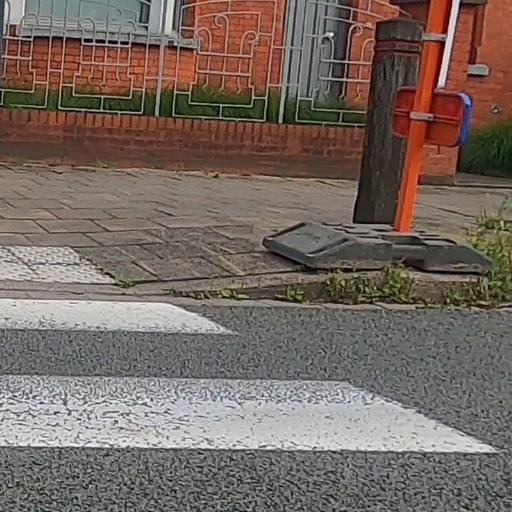

In [ ]:
unnormalized_image = (pixel_values * np.array(ADE_STD)[:, None, None]) + np.array(ADE_MEAN)[:, None, None]
unnormalized_image = (unnormalized_image * 255).astype(np.uint8)
unnormalized_image = np.moveaxis(unnormalized_image, 0, -1)
Image.fromarray(unnormalized_image)

Let's verify the corresponding binary masks + class labels.

In [ ]:
# verify class labels
labels = [id2label[label] for label in batch["class_labels"][0].tolist()]
print(labels)

['Paper cup', 'Wrapping paper', 'Unlabeled litter', 'Cigarette']


In [ ]:
# verify mask labels
batch["mask_labels"][0].shape

torch.Size([1, 512, 512])

In [ ]:
def visualize_mask(labels, label_name):
  print("Label:", label_name)
  idx = labels.index(label_name)

  visual_mask = (batch["mask_labels"][0][idx].bool().numpy() * 255).astype(np.uint8)
  return Image.fromarray(visual_mask)

Label: Plastic film


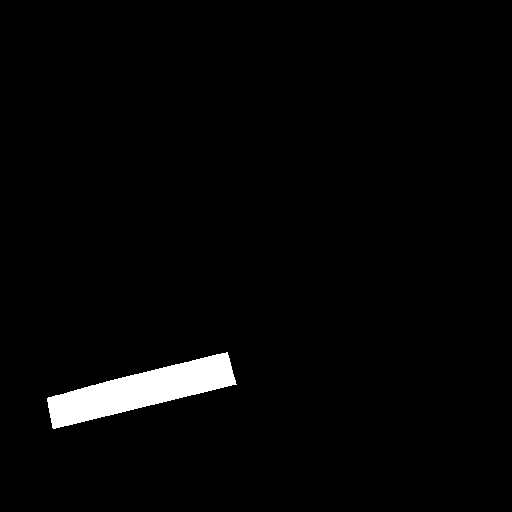

In [ ]:
visualize_mask(labels, "Plastic film")

## Define model

Next, we define the model. We equip the model with pretrained weights from the 🤗 hub. We will replace only the classification head. For that we provide the id2label mapping, and specify to ignore mismatches keys to replace the already fine-tuned classification head.

In [127]:
from transformers import MaskFormerForInstanceSegmentation

# Replace the head of the pre-trained model
model = MaskFormerForInstanceSegmentation.from_pretrained("facebook/maskformer-swin-base-ade",
                                                          id2label=id2label,
                                                          ignore_mismatched_sizes=True).to(device)

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:88: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torch/_utils.py:831: UserWarning: TypedStorage is deprecated. It will be removed in the future and UntypedStorage will be the only storage class. This should only matter to you if you are using storages directly.  To access UntypedStorage directly, use tensor.untyped_storage() instead of tensor.storage()
  return self.fget.__get__(instance, owner)()
Some weights of MaskFormerForInstanceSegmentation were not initialized from the model che

See also the warning here: it's telling us that we are only replacing the class_predictor, which makes sense. As it's the only parameters that we will train from scratch.

## Compute initial loss

Another good way to debug neural networks is to verify the initial loss, see if it makes sense.

In [ ]:
outputs = model(batch["pixel_values"],
                class_labels=batch["class_labels"],
                mask_labels=batch["mask_labels"])
outputs.to(device)

RuntimeError: Input type (torch.FloatTensor) and weight type (torch.cuda.FloatTensor) should be the same or input should be a MKLDNN tensor and weight is a dense tensor

In [ ]:
outputs.loss

tensor([5.0875], grad_fn=<AddBackward0>)

## Train the model

It's time to train the model! We'll use the mIoU metric to track progress.

In [128]:
!pip install -q evaluate

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 84.1/84.1 kB 3.5 MB/s eta 0:00:00


In [129]:
import evaluate

metric = evaluate.load("mean_iou")

In [130]:
import torch
from tqdm.auto import tqdm

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)

optimizer = torch.optim.Adam(model.parameters(), lr=5e-5)

running_loss = 0.0
num_samples = 0
for epoch in range(1):
  print("Epoch:", epoch)
  model.train()
  for idx, batch in enumerate(tqdm(train_dataloader)):
      print(idx)
      # Reset the parameter gradients
      optimizer.zero_grad()

      # Forward pass
      outputs = model(
          pixel_values=batch["pixel_values"].to(device),
          mask_labels=[labels.to(device) for labels in batch["mask_labels"]],
          class_labels=[labels.to(device) for labels in batch["class_labels"]],
      )

      # Backward propagation
      loss = outputs.loss
      loss.backward()

      print([labels.to(device) for labels in batch["class_labels"]])
      print('_____')

      batch_size = batch["pixel_values"].size(0)
      running_loss += loss.item()
      num_samples += batch_size

      if idx % 100 == 0:
        print("Loss:", running_loss/num_samples)

      # Optimization
      optimizer.step()

  model.eval()
  for idx, batch in enumerate(tqdm(test_dataloader)):
    if idx > 5:
      break

    pixel_values = batch["pixel_values"]

    # Forward pass
    with torch.no_grad():
      outputs = model(pixel_values=pixel_values.to(device))

    # get original images
    original_images = batch["original_images"]
    target_sizes = [(image.shape[0], image.shape[1]) for image in original_images]
    # predict segmentation maps
    predicted_segmentation_maps = preprocessor.post_process_semantic_segmentation(outputs,
                                                                                  target_sizes=target_sizes)

    # get ground truth segmentation maps
    ground_truth_segmentation_maps = batch["original_segmentation_maps"]

    metric.add_batch(references=ground_truth_segmentation_maps, predictions=predicted_segmentation_maps)

  # NOTE this metric outputs a dict that also includes the mIoU per category as keys
  # so if you're interested, feel free to print them as well
  print("Mean IoU:", metric.compute(num_labels = len(id2label), ignore_index = 0)['mean_iou'])

Epoch: 0


  0%|          | 0/75 [00:00<?, ?it/s]

0
[tensor([12], device='cuda:0'), tensor([ 6, 27, 39, 58, 59], device='cuda:0')]
_____
Loss: 2.614577293395996
1
[tensor([12, 38, 50], device='cuda:0'), tensor([36], device='cuda:0')]
_____
2
[tensor([20], device='cuda:0'), tensor([22], device='cuda:0')]
_____
3
[tensor([ 6, 39], device='cuda:0'), tensor([36, 59], device='cuda:0')]
_____
4
[tensor([40, 58], device='cuda:0'), tensor([36], device='cuda:0')]
_____
5
[tensor([14, 31], device='cuda:0'), tensor([25, 36], device='cuda:0')]
_____
6
[tensor([12], device='cuda:0'), tensor([12], device='cuda:0')]
_____
7
[tensor([ 9, 21, 58, 59], device='cuda:0'), tensor([53], device='cuda:0')]
_____
8
[tensor([12], device='cuda:0'), tensor([ 4,  7, 10, 50], device='cuda:0')]
_____
9
[tensor([4], device='cuda:0'), tensor([36], device='cuda:0')]
_____
10
[tensor([29], device='cuda:0'), tensor([11, 13, 31, 33], device='cuda:0')]
_____
11
[tensor([58], device='cuda:0'), tensor([39], device='cuda:0')]
_____
12
[tensor([7], device='cuda:0'), tensor([3

  0%|          | 0/25 [00:00<?, ?it/s]

/root/.cache/huggingface/modules/evaluate_modules/metrics/evaluate-metric--mean_iou/08bc20f4f895f3caf75fb9e3fada1404bded3c3265243d05327cbb3b9326ffe9/mean_iou.py:259: RuntimeWarning: invalid value encountered in divide
  iou = total_area_intersect / total_area_union
/root/.cache/huggingface/modules/evaluate_modules/metrics/evaluate-metric--mean_iou/08bc20f4f895f3caf75fb9e3fada1404bded3c3265243d05327cbb3b9326ffe9/mean_iou.py:260: RuntimeWarning: invalid value encountered in divide
  acc = total_area_intersect / total_area_label


Mean IoU: 0.0004523609117557793


In [ ]:
np.unique(train_dataset[68][1])

array([0], dtype=uint8)

(240, 240)
[0]


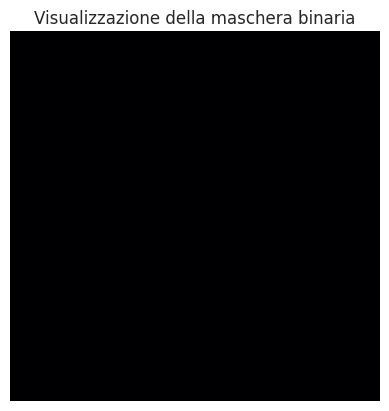

In [ ]:
import matplotlib.pyplot as plt


label_mask_cpu = train_dataset[68][1]

print(label_mask_cpu.shape)
print(np.unique(label_mask_cpu))


# Display the binary mask as an image
plt.imshow(label_mask_cpu, cmap='inferno')  # Usa la mappa di colori 'inferno' per immagini binarie
plt.title('Visualizzazione della maschera binaria')
plt.axis('off')

plt.show()


## Inference

After training, we can use the model to make predictions on new data.

Let's showcase this one of the examples of a test batch.

In [131]:
# let's take the first test batch
batch = next(iter(test_dataloader))
for k,v in batch.items():
  if isinstance(v, torch.Tensor):
    print(k,v.shape)
  else:
    print(k,len(v))

pixel_values torch.Size([2, 3, 240, 240])
pixel_mask torch.Size([2, 240, 240])
mask_labels 2
class_labels 2
original_images 2
original_segmentation_maps 2


In [132]:
# forward pass
with torch.no_grad():
  outputs = model(batch["pixel_values"].to(device))

In [133]:
original_images = batch["original_images"]
target_sizes = [(image.shape[0], image.shape[1]) for image in original_images]
# predict segmentation maps
predicted_segmentation_maps = preprocessor.post_process_semantic_segmentation(outputs, target_sizes=target_sizes)

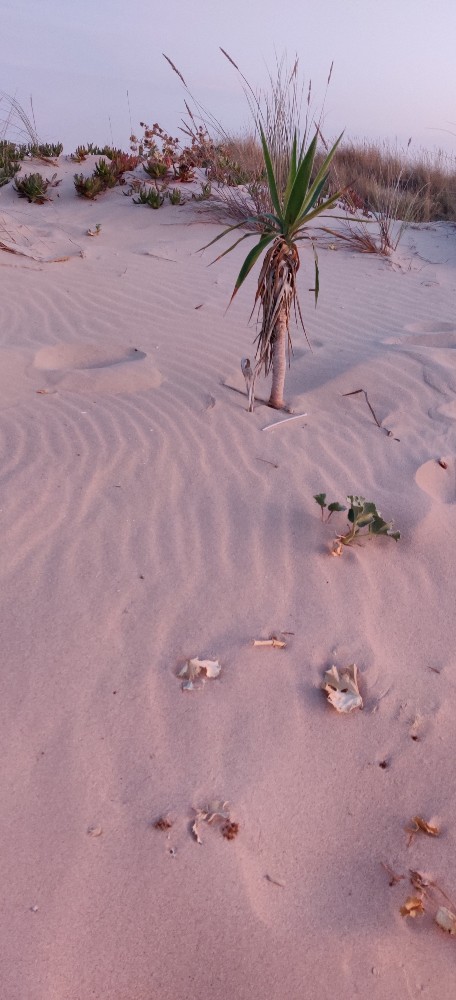

In [134]:
image = batch["original_images"][0]
Image.fromarray(image)

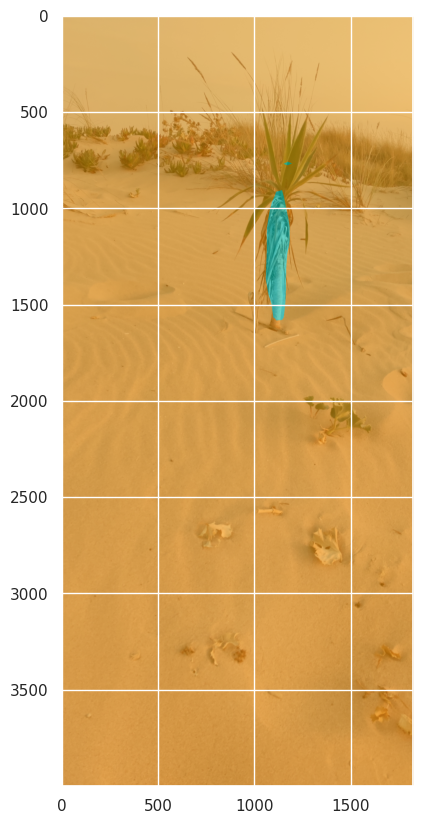

In [137]:
import numpy as np
import matplotlib.pyplot as plt

segmentation_map = predicted_segmentation_maps[0].cpu().numpy()

color_segmentation_map = np.zeros((segmentation_map.shape[0], segmentation_map.shape[1], 3), dtype=np.uint8) # height, width, 3
for label, color in enumerate(palette):
    color_segmentation_map[segmentation_map == label, :] = color
# Convert to BGR
ground_truth_color_seg = color_segmentation_map[..., ::-1]

img = image * 0.5 + ground_truth_color_seg * 0.5
img = img.astype(np.uint8)

plt.figure(figsize=(15, 10))
plt.imshow(img)
plt.show()

Compare to the ground truth:

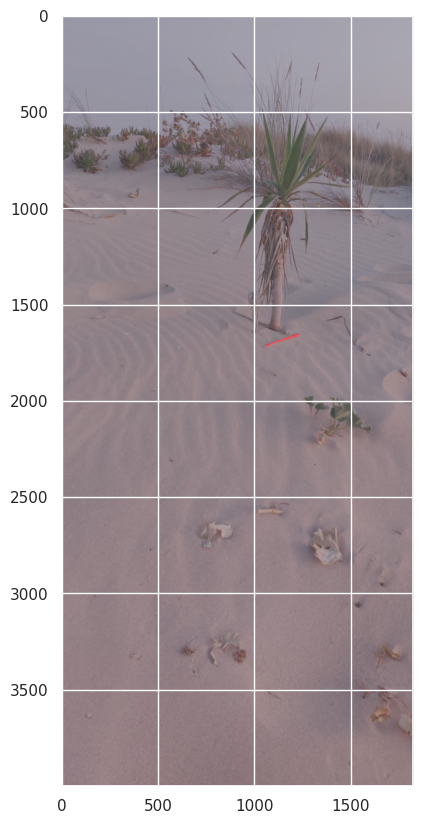

In [138]:
import numpy as np
import matplotlib.pyplot as plt

segmentation_map = batch["original_segmentation_maps"][0]

color_segmentation_map = np.zeros((segmentation_map.shape[0], segmentation_map.shape[1], 3), dtype=np.uint8) # height, width, 3
for label, color in enumerate(palette):
    color_segmentation_map[segmentation_map == label, :] = color
# Convert to BGR
ground_truth_color_seg = color_segmentation_map[..., ::-1]

img = image * 0.5 + ground_truth_color_seg * 0.5
img = img.astype(np.uint8)

plt.figure(figsize=(15, 10))
plt.imshow(img)
plt.show()

I didn't do a lot of training (only 2 epochs), and results don't look too bad. I'd suggest checking the paper to find all details regarding training hyperparameters (number of epochs, learning rate, etc.).